In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import requests
import tensorflow_datasets as tfds
from tqdm import tqdm
import os
import shutil
from tensorflow.keras.layers import Input, Dense ,Conv2D,MaxPooling2D ,Dropout


import keras
import cv2
from keras.models import Sequential
from keras.preprocessing.image import img_to_array
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt

2024-03-21 00:32:12.616105: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-21 00:32:12.616211: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-21 00:32:12.767754: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 512
high_img = []
path = '../input/sr-3000/SR-3000/HR/train'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files[:1000]):       
    img = cv2.imread(path + '/'+i,1)
    # open cv reads images in BGR format so we have to convert it to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #resizing image
    img = cv2.resize(img, (SIZE, SIZE))
    img = img.astype('float32') / 255.0
    high_img.append(img_to_array(img))


low_img = []
path = '../input/sr-3000/SR-3000/HR/train'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files[:1000]):
    img = cv2.imread(os.path.join(path, i), 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Resizing image to a smaller size using bicubic interpolation
    small_img = cv2.resize(img, (180, 180))
    
    # Resizing the small image back to the original size
    pixelated_img = cv2.resize(small_img, (SIZE, SIZE))
    
    pixelated_img = pixelated_img.astype('float32') / 255.0
    low_img.append(pixelated_img)

100%|██████████| 1000/1000 [00:08<00:00, 115.40it/s]


In [3]:
# import os
# import cv2
# import re
# from tqdm import tqdm
# from keras.preprocessing.image import img_to_array

# # Function to sort alphanumeric strings
# def sorted_alphanumeric(data):
#     convert = lambda text: int(text) if text.isdigit() else text.lower()
#     alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
#     return sorted(data, key=alphanum_key)

# # Defining the size of the image
# SIZE = 256

# # List to store high-resolution images
# high_img = []

# # Paths to process
# paths = ['../input/sr-3000/SR-3000/HR/train', '../input/sr-3000/SR-3000/HR/val', '../input/sr-3000/SR-3000/HR/test']

# # Iterating over each path
# for path in paths:
#     # Getting files in proper order
#     files = os.listdir(path)
#     files = sorted_alphanumeric(files)
    
#     # Processing each file
#     for i in tqdm(files):
#         img = cv2.imread(os.path.join(path, i), 1)
#         img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#         img = cv2.resize(img, (SIZE, SIZE))
#         img = img.astype('float32') / 255.0
#         high_img.append(img_to_array(img))

# # List to store low-resolution images
# low_img = []

# # Iterating over each path (same as above)
# for path in paths:
#     files = os.listdir(path)
#     files = sorted_alphanumeric(files)
    
#     for i in tqdm(files):
#         img = cv2.imread(os.path.join(path, i), 1)
#         img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
#         small_img = cv2.resize(img, (180, 180))
#         pixelated_img = cv2.resize(small_img, (SIZE, SIZE))
        
#         pixelated_img = pixelated_img.astype('float32') / 255.0
#         low_img.append(pixelated_img)


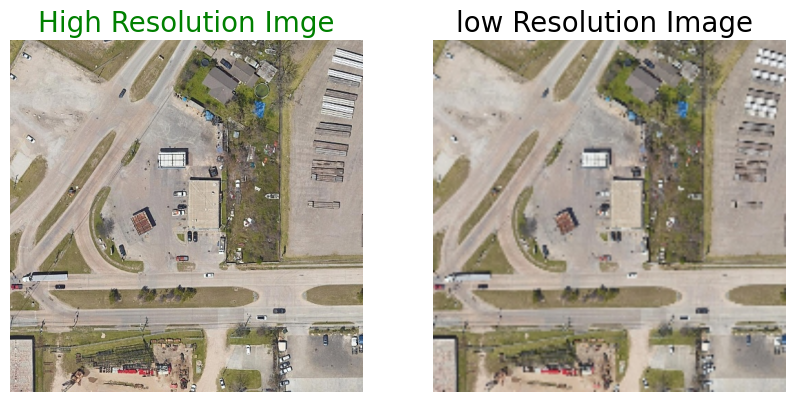

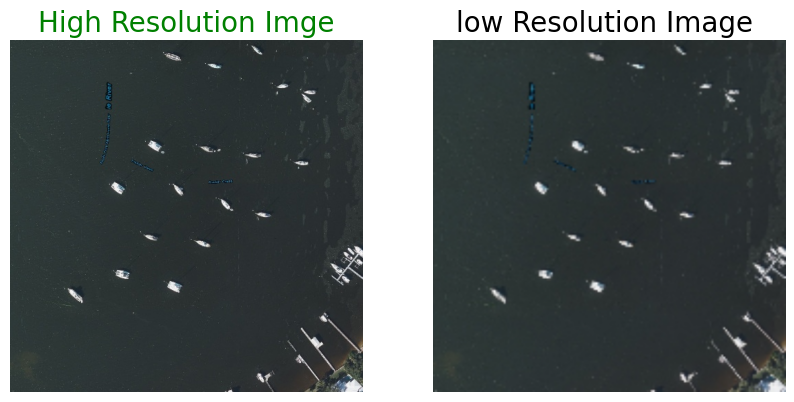

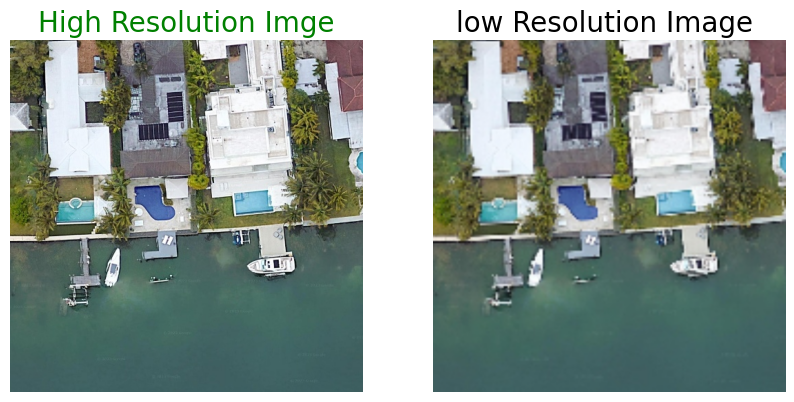

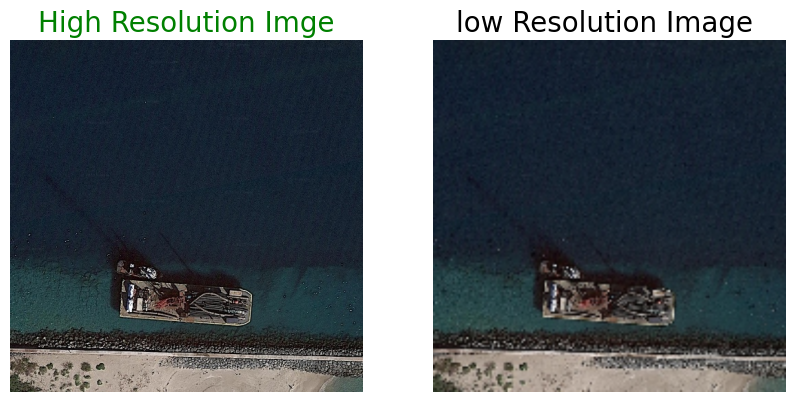

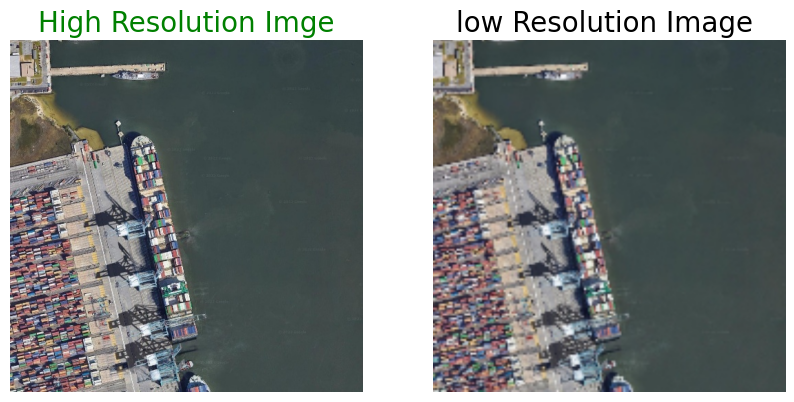

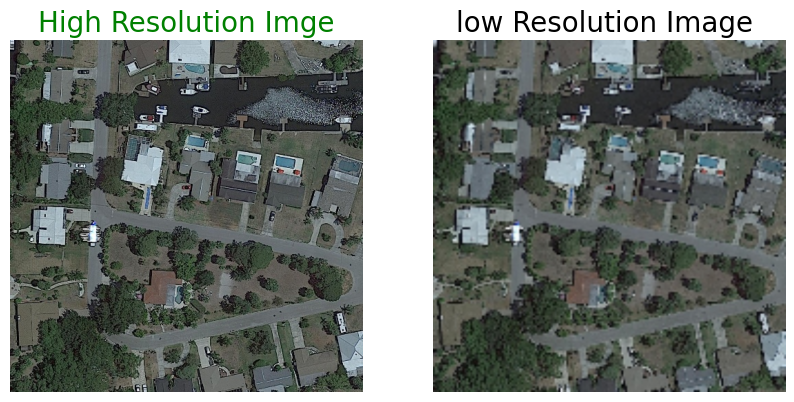

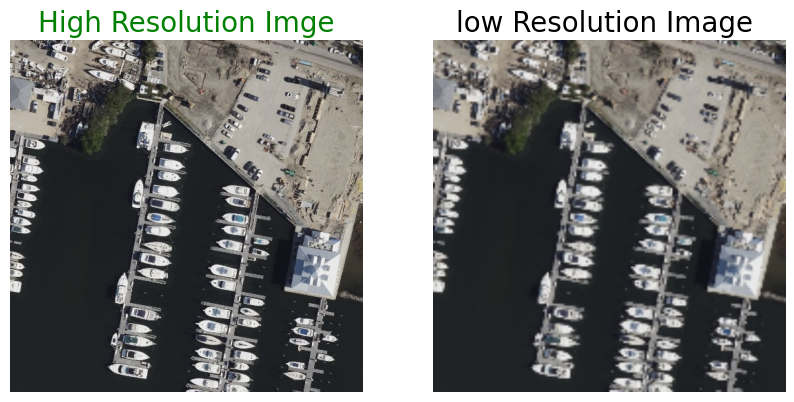

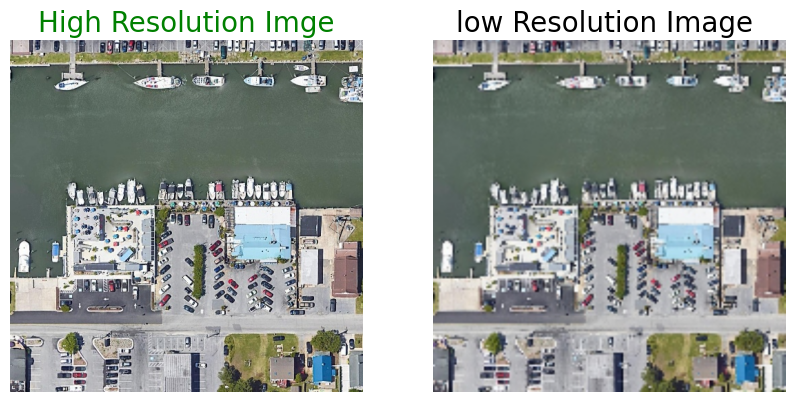

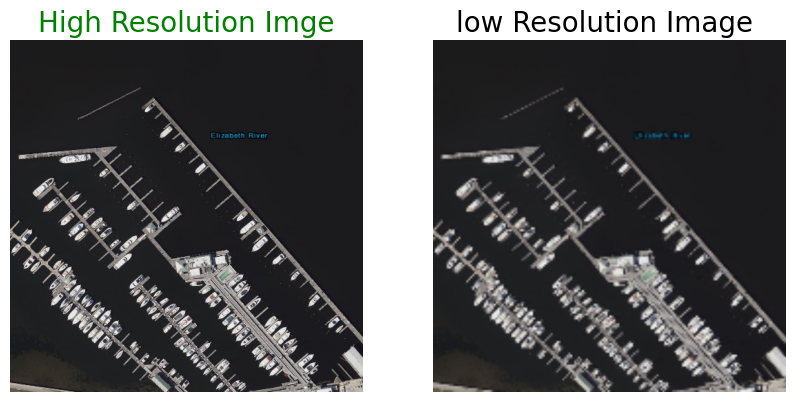

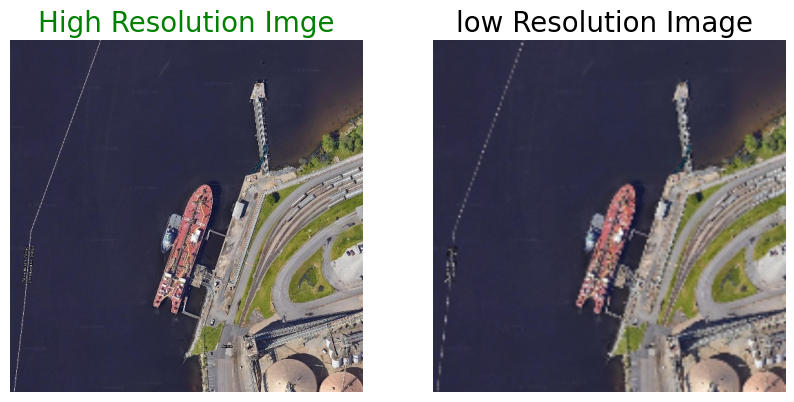

In [4]:
for i in range(10):
    a = np.random.randint(0,855)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 20)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 20)
    plt.imshow(low_img[a])
    plt.axis('off')

In [5]:
import numpy as np

# Assuming high_img and low_img are already defined

# Calculate the number of samples for each set
total_samples = len(high_img)
train_samples = int(total_samples * 0.7)
valid_samples = int(total_samples * 0.2)
test_samples = total_samples - train_samples - valid_samples

# Split high_img and low_img
train_high_image = high_img[:train_samples]
train_low_image = low_img[:train_samples]
train_high_image = np.reshape(train_high_image, (len(train_high_image), SIZE, SIZE, 3))
train_low_image = np.reshape(train_low_image, (len(train_low_image), SIZE, SIZE, 3))

validation_high_image = high_img[train_samples:train_samples + valid_samples]
validation_low_image = low_img[train_samples:train_samples + valid_samples]
validation_high_image = np.reshape(validation_high_image, (len(validation_high_image), SIZE, SIZE, 3))
validation_low_image = np.reshape(validation_low_image, (len(validation_low_image), SIZE, SIZE, 3))

test_high_image = high_img[train_samples + valid_samples:]
test_low_image = low_img[train_samples + valid_samples:]
test_high_image = np.reshape(test_high_image, (len(test_high_image), SIZE, SIZE, 3))
test_low_image = np.reshape(test_low_image, (len(test_low_image), SIZE, SIZE, 3))

print("Shape of training images:", train_high_image.shape)
print("Shape of test images:", test_high_image.shape)
print("Shape of validation images:", validation_high_image.shape)

print("Shape of training images:", train_low_image.shape)
print("Shape of test images:", test_low_image.shape)
print("Shape of validation images:", validation_low_image.shape)


Shape of training images: (700, 512, 512, 3)
Shape of test images: (100, 512, 512, 3)
Shape of validation images: (200, 512, 512, 3)
Shape of training images: (700, 512, 512, 3)
Shape of test images: (100, 512, 512, 3)
Shape of validation images: (200, 512, 512, 3)


In [6]:
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.optimizers.schedules import PiecewiseConstantDecay
# from tensorflow.keras import layers
# from tensorflow.keras.utils import plot_model

# def residual_block_gen(ch=64,k_s=3,st=1):
#     model=tf.keras.Sequential([
#     tf.keras.layers.Conv2D(ch,k_s,strides=(st,st),padding='same'),
#     tf.keras.layers.BatchNormalization(),
#     tf.keras.layers.LeakyReLU(),
#     tf.keras.layers.Conv2D(ch,k_s,strides=(st,st),padding='same'),
#     tf.keras.layers.BatchNormalization(),
#     tf.keras.layers.LeakyReLU(),])
#     return model

# import tensorflow as tf

# def Upsample_block(x, ch=256, k_s=3, st=1):
#     x = tf.keras.layers.Conv2D(ch, k_s, strides=(st,st), padding='same')(x)
#     x = tf.keras.layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(x) # Wrap depth_to_space in a Lambda layer
#     x = tf.keras.layers.LeakyReLU()(x)
#     return x


# lr=tf.keras.layers.Input(shape=(256,256,3))
# input_conv=tf.keras.layers.Conv2D(64,9,padding='same')(lr)
# input_conv=tf.keras.layers.LeakyReLU()(input_conv)

# def model():
#     SRRes=input_conv
#     for x in range(5):
#         res_output=residual_block_gen()(SRRes)
#         SRRes=Upsample_block(SRRes)
#         SRRes=MaxPooling2D()(SRRes)
#         SRRes=tf.keras.layers.Add()([SRRes,res_output])
#         SRRes=tf.keras.layers.Conv2D(64,9,padding='same')(SRRes)
#     SRRes=tf.keras.layers.BatchNormalization()(SRRes)
#     SRRes=tf.keras.layers.Add()([SRRes,input_conv])
#     SRRes=Upsample_block(SRRes)
#     SRRes=MaxPooling2D()(SRRes)
#     #SRRes=Upsample_block(SRRes)
#     #SRRes=downsample_image(SRRes,4)
#     #SRRes=Upsample_block(SRRes)
#     output_sr=tf.keras.layers.Conv2D(3,9,activation='sigmoid',padding='same')(SRRes)
#     return tf.keras.models.Model(lr,output_sr)

# model = model()

# model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'mean_absolute_error',
#               metrics = ['acc'])

In [7]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import PiecewiseConstantDecay
from tensorflow.keras import layers
from tensorflow.keras.layers import GlobalAveragePooling2D, Reshape, Dense, multiply
from tensorflow.keras.utils import plot_model

def residual_block_gen(ch=64,k_s=3,st=1):
    model=tf.keras.Sequential([
    tf.keras.layers.Conv2D(ch,k_s,strides=(st,st),padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(),
    tf.keras.layers.Conv2D(ch,k_s,strides=(st,st),padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(),])
    return model

import tensorflow as tf

def Upsample_block(x, ch=256, k_s=3, st=1):
    x = tf.keras.layers.Conv2D(ch, k_s, strides=(st,st), padding='same')(x)
    x = tf.keras.layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(x) # Wrap depth_to_space in a Lambda layer
    x = tf.keras.layers.LeakyReLU()(x)
    return x

def se_block(input_tensor, ch_ratio=16): # Squeeze and Excitation Block
    ch_input = int(input_tensor.shape[-1])
    squeeze = GlobalAveragePooling2D()(input_tensor)
    excitation = Dense(ch_input//ch_ratio, activation='relu')(squeeze)
    excitation = Dense(ch_input, activation='sigmoid')(excitation)
    excitation = Reshape((1, 1, ch_input))(excitation)
    scaled_input = multiply([input_tensor, excitation])
    return scaled_input

lr=tf.keras.layers.Input(shape=(512,512,3))
input_conv=tf.keras.layers.Conv2D(64,9,padding='same')(lr)
input_conv=tf.keras.layers.LeakyReLU()(input_conv)

def model():
    SRRes=input_conv
    for x in range(5):
        res_output=residual_block_gen()(SRRes)
        SRRes=Upsample_block(SRRes)
        SRRes=MaxPooling2D()(SRRes)
        SRRes=tf.keras.layers.Add()([SRRes,res_output])
        SRRes=tf.keras.layers.Conv2D(64,9,padding='same')(SRRes)
        SRRes = se_block(SRRes) # Applying SE block after each residual block
    SRRes=tf.keras.layers.BatchNormalization()(SRRes)
    SRRes=tf.keras.layers.Add()([SRRes,input_conv])
    SRRes=Upsample_block(SRRes)
    SRRes=MaxPooling2D()(SRRes)
    #SRRes=Upsample_block(SRRes)
    #SRRes=downsample_image(SRRes,4)
    #SRRes=Upsample_block(SRRes)
    output_sr=tf.keras.layers.Conv2D(3,9,activation='sigmoid',padding='same')(SRRes)
    return tf.keras.models.Model(lr,output_sr)

model = model()

model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'mean_absolute_error',
              metrics = ['acc'])


In [8]:
import logging
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # FATAL
logging.getLogger('tensorflow').setLevel(logging.FATAL)

Epoch 1/40


I0000 00:00:1710981239.639868      75 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1710981239.673825      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1710981239.676146      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1710981239.678364      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1710981239.680570      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1710981239.682935      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - acc: 0.4196 - loss: 0.1217

W0000 00:00:1710981657.889961      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1710981657.892038      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1710981657.894147      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1710981657.896173      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1710981657.898249      75 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


350/350 ━━━━━━━━━━━━━━━━━━━━ 506s 1s/step - acc: 0.4197 - loss: 0.1217 - val_acc: 0.3650 - val_loss: 0.0960
Epoch 2/40
350/350 ━━━━━━━━━━━━━━━━━━━━ 457s 1s/step - acc: 0.4349 - loss: 0.0931 - val_acc: 0.3019 - val_loss: 0.2926
Epoch 3/40
350/350 ━━━━━━━━━━━━━━━━━━━━ 502s 1s/step - acc: 0.4929 - loss: 0.0737 - val_acc: 0.2697 - val_loss: 0.4006
Epoch 4/40
350/350 ━━━━━━━━━━━━━━━━━━━━ 502s 1s/step - acc: 0.4896 - loss: 0.0713 - val_acc: 0.3819 - val_loss: 0.1577
Epoch 5/40
350/350 ━━━━━━━━━━━━━━━━━━━━ 450s 1s/step - acc: 0.5540 - loss: 0.0619 - val_acc: 0.5257 - val_loss: 0.0901
Epoch 6/40
350/350 ━━━━━━━━━━━━━━━━━━━━ 450s 1s/step - acc: 0.5821 - loss: 0.0574 - val_acc: 0.4705 - val_loss: 0.1014
Epoch 7/40
350/350 ━━━━━━━━━━━━━━━━━━━━ 502s 1s/step - acc: 0.5353 - loss: 0.0888 - val_acc: 0.5635 - val_loss: 0.0845
Epoch 8/40
350/350 ━━━━━━━━━━━━━━━━━━━━ 450s 1s/step - acc: 0.5844 - loss: 0.0601 - val_acc: 0.7307 - val_loss: 0.0762
Epoch 9/40
350/350 ━━━━━━━━━━━━━━━━━━━━ 450s 1s/step - acc:

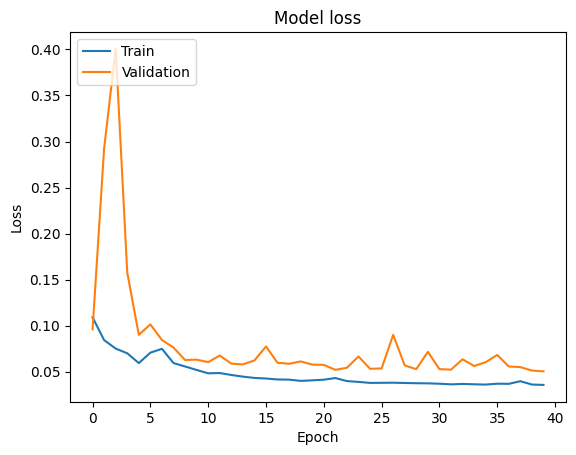

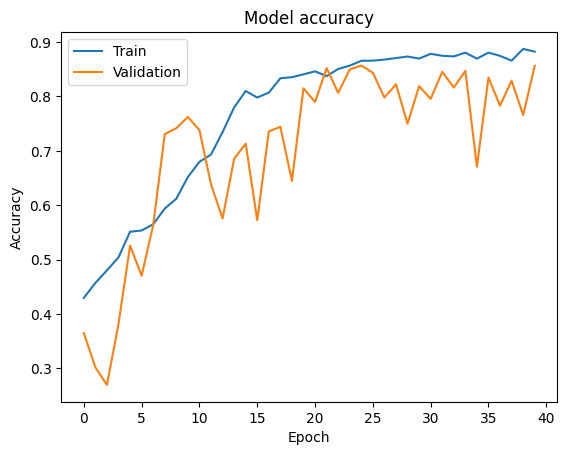

In [9]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio

class PSNRCallback(tf.keras.callbacks.Callback):
    def __init__(self, train_data, val_data):
        super(PSNRCallback, self).__init__()
        self.train_data = train_data
        self.val_data = val_data

    def on_epoch_end(self, epoch, logs=None):
        # Calculate training PSNR
        x_train, y_train = self.train_data
        y_train_pred = self.model.predict(x_train)
        train_psnr = np.mean([peak_signal_noise_ratio(y_train[i], y_train_pred[i]) for i in range(len(y_train))])
        print(f' - train_PSNR: {train_psnr:.2f} dB')

        # Calculate validation PSNR
        x_val, y_val = self.val_data
        y_val_pred = self.model.predict(x_val)
        val_psnr = np.mean([peak_signal_noise_ratio(y_val[i], y_val_pred[i]) for i in range(len(y_val))])
        print(f' - val_PSNR: {val_psnr:.2f} dB')

        if logs is not None:
            logs['train_PSNR'] = train_psnr
            logs['val_PSNR'] = val_psnr

# Define your model and compile it

# history = model.fit(train_low_image, train_high_image, epochs=2, batch_size=2,
#                     validation_data=(validation_low_image, validation_high_image),
#                     callbacks=[PSNRCallback((train_low_image, train_high_image), (validation_low_image, validation_high_image))])


history = model.fit(train_low_image, train_high_image, epochs=40, batch_size=2,validation_data=(validation_low_image, validation_high_image),callbacks=[])

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# # Plot training & validation PSNR
# plt.plot(history.history['train_PSNR'])
# plt.plot(history.history['val_PSNR'])
# plt.title('Training & Validation PSNR')
# plt.ylabel('PSNR (dB)')
# plt.xlabel('Epoch')
# plt.legend(['Train', 'Validation'], loc='upper left')
# plt.show()


In [10]:
def PSNR(y_true,y_pred):
  mse=tf.reduce_mean( (y_true - y_pred) ** 2 )
  return 20 * log10(1 / (mse ** 0.5))

def log10(x):
  numerator = tf.math.log(x)
  denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
  return numerator / denominator

def pixel_MSE(y_true,y_pred):
  return tf.reduce_mean( (y_true - y_pred) ** 2 )

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


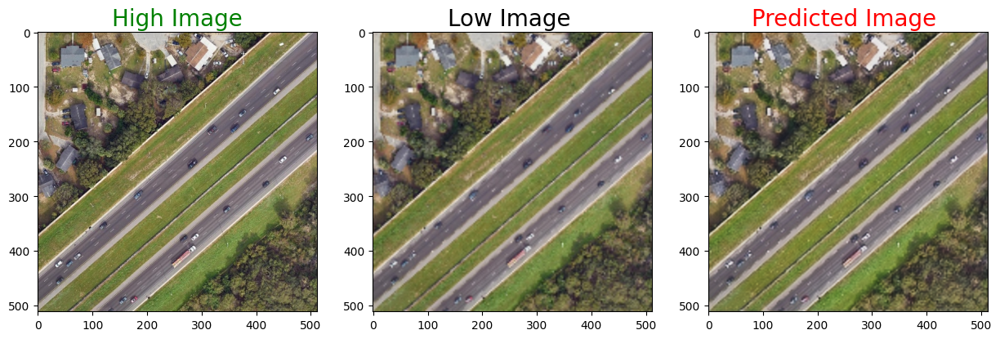

PSNR tf.Tensor(23.473946, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


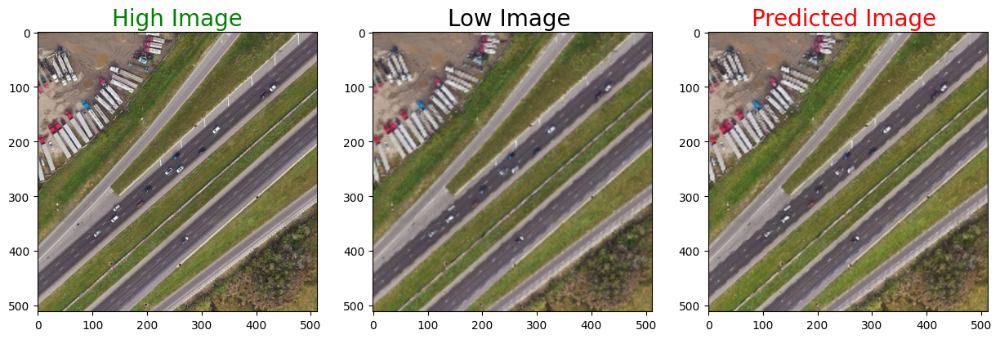

PSNR tf.Tensor(23.384747, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


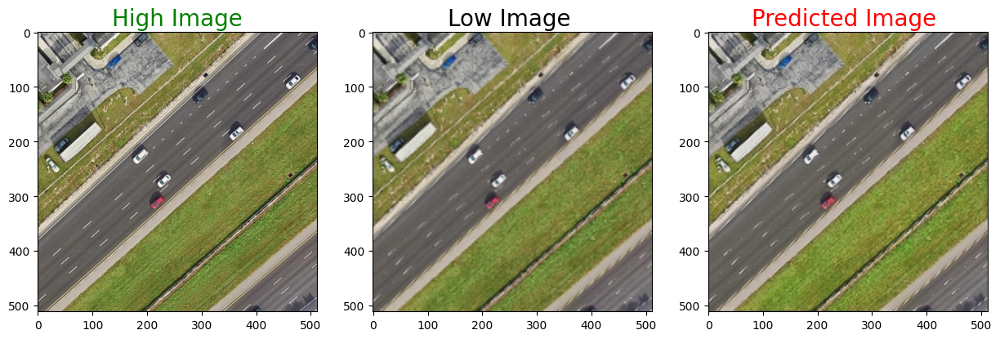

PSNR tf.Tensor(22.53131, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


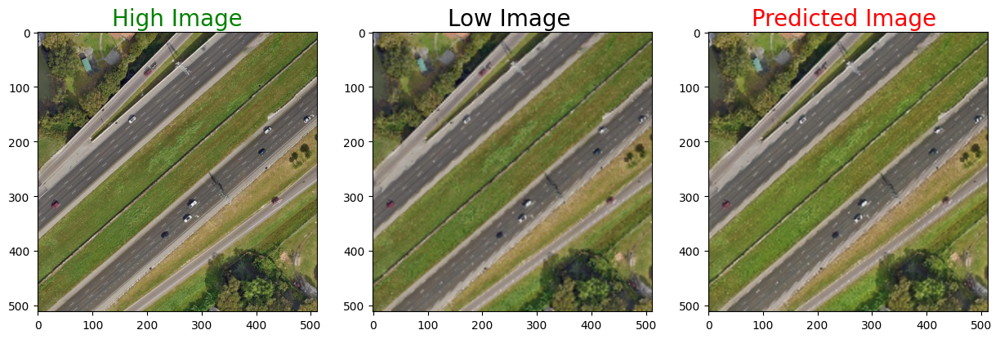

PSNR tf.Tensor(23.821394, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


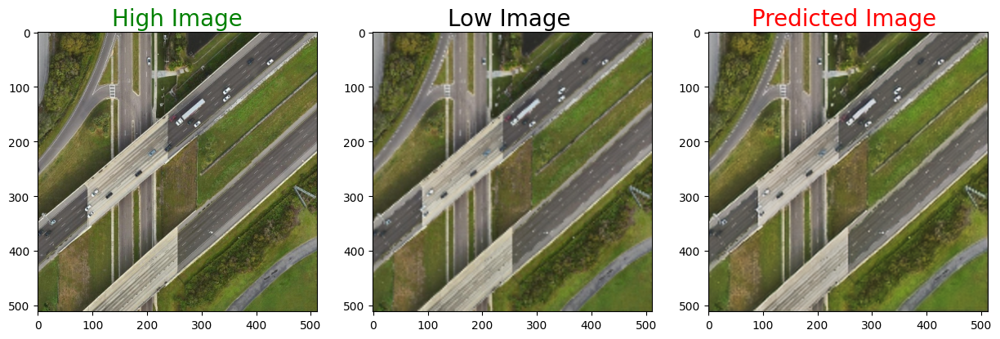

PSNR tf.Tensor(24.42359, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


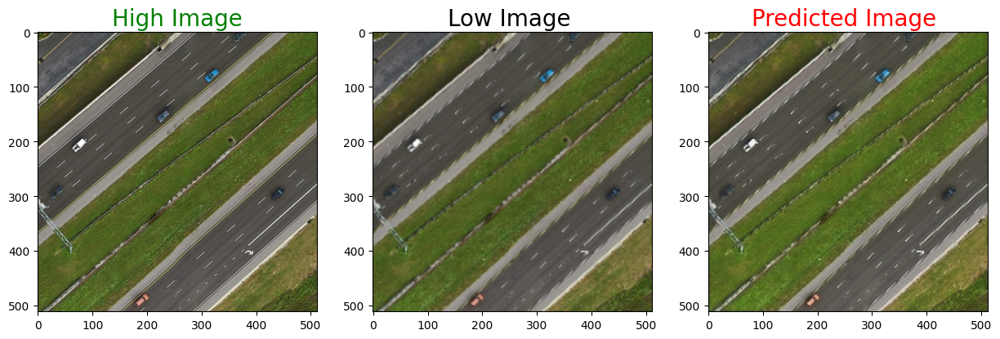

PSNR tf.Tensor(23.20574, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


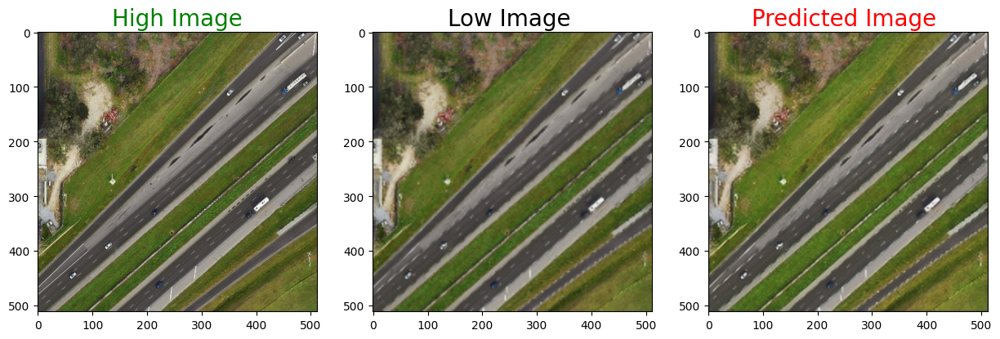

PSNR tf.Tensor(23.692015, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


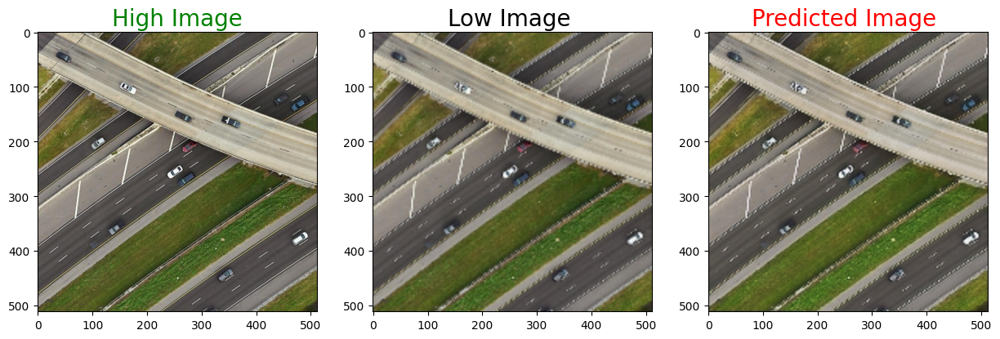

PSNR tf.Tensor(22.221798, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


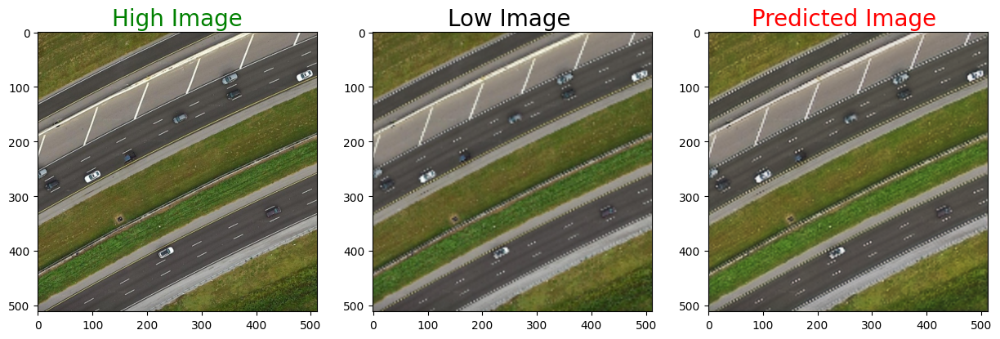

PSNR tf.Tensor(22.26202, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


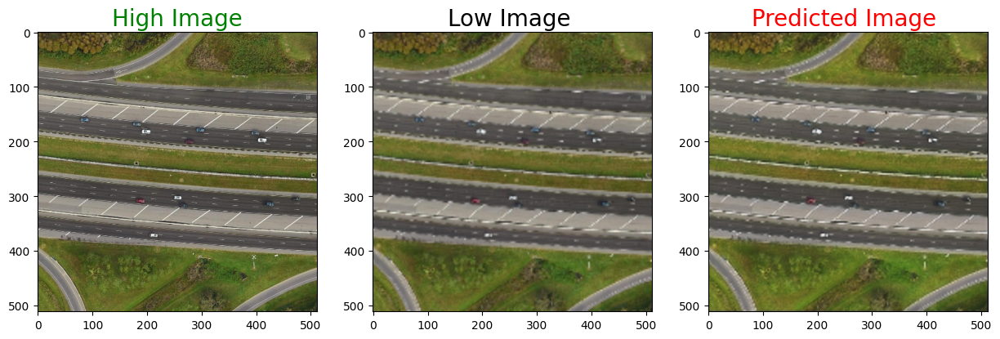

PSNR tf.Tensor(23.174244, shape=(), dtype=float32)


In [11]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(10,20):
    
    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)
    print('PSNR', PSNR(test_high_image[i],predicted))

In [12]:

# import numpy as np
# import tensorflow as tf
# from tqdm.auto import tqdm  # Import tqdm

# def PSNR(y_true, y_pred):
#     mse = tf.reduce_mean((y_true - y_pred) ** 2)
#     return 20 * log10(1 / tf.sqrt(mse))

# def log10(x):
#     numerator = tf.math.log(x)
#     denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
#     return numerator / denominator

# def pixel_MSE(y_true, y_pred):
#     return tf.reduce_mean((y_true - y_pred) ** 2)

# def calculate_psnr(model, test_low_images, test_high_images):
#     psnr_scores = []
#     with tqdm(total=len(test_low_images), leave=False) as pbar:
#         for i in range(len(test_low_images)):
#             # Suppress output with verbose=0
#             predicted = np.clip(model.predict(test_low_images[i].reshape(1, SIZE, SIZE, 3), verbose=0), 0.0, 1.0).reshape(SIZE, SIZE, 3)
#             psnr_score = PSNR(test_high_images[i], predicted)
#             psnr_scores.append(psnr_score)
#             pbar.update(1)
#     average_psnr = np.mean(psnr_scores)
#     return average_psnr

# # Assuming you have `model`, `test_low_image`, and `test_high_image` defined elsewhere
# average_psnr = calculate_psnr(model, test_low_image, test_high_image)
# print('Average PSNR on the test set:', average_psnr)


In [13]:
import numpy as np
import tensorflow as tf
from tqdm.auto import tqdm  # Import tqdm

def PSNR(y_true, y_pred):
    mse = tf.reduce_mean((y_true - y_pred) ** 2)
    return 20 * log10(1 / tf.sqrt(mse))

def log10(x):
    numerator = tf.math.log(x)
    denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator

def pixel_MSE(y_true, y_pred):
    return tf.reduce_mean((y_true - y_pred) ** 2)

def ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

def calculate_metrics(model, test_low_images, test_high_images):
    psnr_scores = []
    ssim_scores = []
    with tqdm(total=len(test_low_images), leave=False) as pbar:
        for i in range(len(test_low_images)):
            predicted = np.clip(model.predict(test_low_images[i].reshape(1, SIZE, SIZE, 3), verbose=0), 0.0, 1.0).reshape(SIZE, SIZE, 3)
            psnr_score = PSNR(test_high_images[i], predicted)
            ssim_score = ssim(tf.convert_to_tensor(test_high_images[i]), tf.convert_to_tensor(predicted))
            psnr_scores.append(psnr_score)
            ssim_scores.append(ssim_score)
            pbar.update(1)
    average_psnr = np.mean(psnr_scores)
    average_ssim = np.mean(ssim_scores)
    return average_psnr, average_ssim

# Assuming you have `model`, `test_low_image`, and `test_high_image` defined elsewhere
average_psnr, average_ssim = calculate_metrics(model, test_low_image, test_high_image)
print('Average PSNR on the test set:', average_psnr)
print('Average SSIM on the test set:', average_ssim)


  0%|          | 0/100 [00:00<?, ?it/s]

Average PSNR on the test set: 21.256836
Average SSIM on the test set: 0.63166034


In [14]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image as kimage

# Function to generate high-resolution image from low-resolution image
def generate_high_resolution_image(lr_image, model):
    # Preprocess low-resolution image
    small_img = cv2.resize(lr_image, (180, 180))
    pixelated_img = cv2.resize(small_img, (512, 512))  # Upscale to 256x256
    pixelated_img = pixelated_img.astype('float32') / 255.0
    pixelated_img = np.expand_dims(pixelated_img, axis=0)  # Add batch dimension
    
    # Generate high-resolution image using the model
    generated_img = model.predict(pixelated_img)
    
    # Convert generated image back to uint8 and remove batch dimension
    generated_img = (generated_img[0] * 255).astype(np.uint8)
    
    return generated_img

# Path to the directory containing low-resolution images
lr_images_dir = "/kaggle/input/sat-yolo-512x512/sat-yolo-512x512/images"  # Replace with your directory path

# Iterate over all images in the directory
for filename in os.listdir(lr_images_dir):
    if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png"):
        # Read the image
        lr_image_path = os.path.join(lr_images_dir, filename)
        lr_image = cv2.imread(lr_image_path)
        lr_image = cv2.cvtColor(lr_image, cv2.COLOR_BGR2RGB)
        
        # Generate high-resolution image
        high_res_image = generate_high_resolution_image(lr_image, model)
        
        # Save the generated high-resolution image with the same name as the source
        output_path = os.path.join("/kaggle/working/", filename)
        cv2.imwrite(output_path, cv2.cvtColor(high_res_image, cv2.COLOR_RGB2BGR))
        print(f"Generated high-resolution image saved at: {output_path}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Generated high-resolution image saved at: /kaggle/working/car626_jpg.rf.a62f4f80ec561bb6ca58d4eec79a532d.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Generated high-resolution image saved at: /kaggle/working/boat647_jpg.rf.a158c209822818fb90ced75bac12892b.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Generated high-resolution image saved at: /kaggle/working/car668_jpg.rf.8d9d26a522ed335dc91a19c6e4023272.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Generated high-resolution image saved at: /kaggle/working/boat268_jpg.rf.fc4287e900f7cdbe10fba395bef827a2.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Generated high-resolution image saved at: /kaggle/working/plane431_jpg.rf.a4bcb7c6c4479374c381a1e1b082339c.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Generated high-resolution image saved at: /kaggle/working/boat19_jpg.rf.c0c0265ead34bb1d9d415a91ad18d2b1.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Generated high-resolution image saved at: /kaggle/working/boat271_jpg.rf.bb1